In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def display(frame, size=(20,20)):
    plt.figure(figsize=size)
    plt.imshow(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()
    
fps = 20.0

# 1. Create, open video

## 1.1 Capture video using webcam

**/!\ Cannot execute this code in Notebook, need opencv-python-headless**

In [ ]:
# Create a VideoCapture object
cap = cv2.VideoCapture(0)
 
# Check if camera opened successfully
if not cap.isOpened():
    print("Unable to read camera feed")

# Default resolutions of the frame are obtained.The default resolutions are system dependent.
# We convert the resolutions from float to integer.
frame_width = int(cap.get(3))
frame_height = int(cap.get(4))

# Define the codec and create VideoWriter object.The output is stored in 'output.avi' file
# CODEC IMPORTANT FOR OSX.
out = cv2.VideoWriter('cameracapture.avi',cv2.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height))

while True:
    ret, frame = cap.read()
    if ret: 
        # Write the frame into the file 'output.avi'
        out.write(frame)

        # Display the resulting frame (NOT IN NOTEBOOK)
        cv2.imshow('frame',frame)
        # Press Q on keyboard to stop recording
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break

    # Break the loop
    else:
        break 

# When everything done, release the video capture and video write objects
cap.release()
out.release()
 
# Closes all the frames
cv2.destroyAllWindows() 

## 1.2 Store video as array of frames

In [3]:
def create_array(name):
    array = []
    cap = cv2.VideoCapture(name)
    while True:
        ret, frame = cap.read()
        if ret:
            array.append(frame)
        # Break the loop
        else:
            break
    cap.release()
    return array

In [4]:
CAPTURE_ARRAY = create_array('videos/cameracapture.avi')
SKI_ARRAY = create_array('videos/ski.avi')

# 2. Tracking

## 2.1 Using SIFT
See code in Sift notebook.

## 2.2 Using Mean Shift

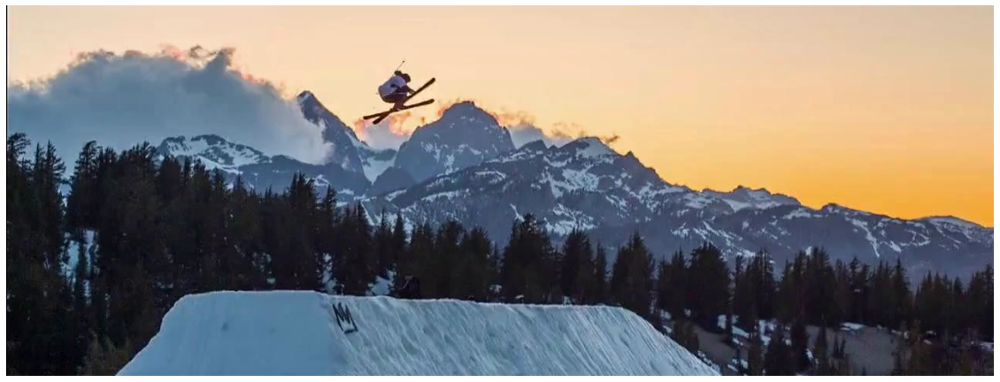

Start at frame number:  30


In [5]:
n = 30
start_frame = SKI_ARRAY[n]
display(start_frame)
print("Start at frame number: ",n)

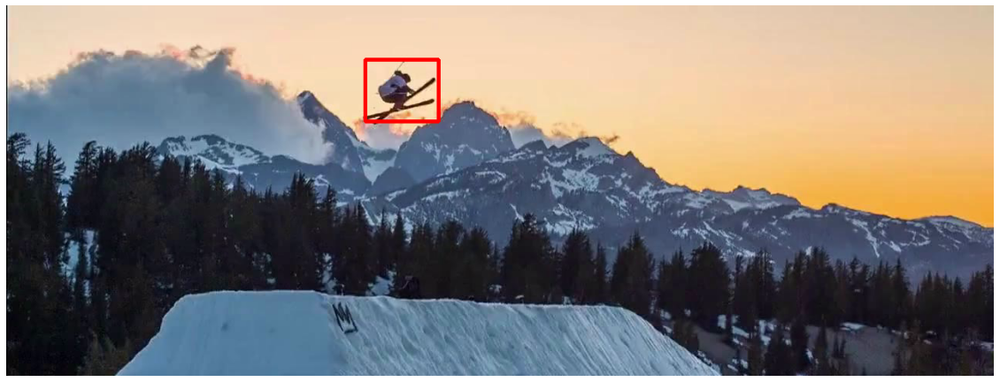

In [6]:
# setup initial location of window
x,y,w,h = 465,70,95,80  # simply hardcoded the values
track_window = (x,y,w,h)

img_region = cv2.rectangle(start_frame.copy(), (x, y), (x+w, y+h), (0,0,255), 3)
display(img_region)

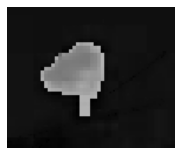

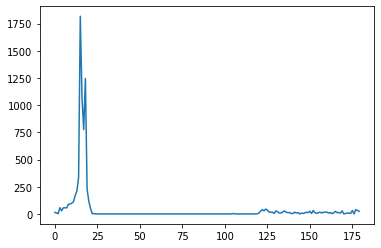

In [7]:
frame = np.copy(start_frame)
# set up the ROI for tracking
roi = frame[y:y+h, x:x+w]

hsv_roi = cv2.cvtColor(roi, cv2.COLOR_BGR2HSV)

display(hsv_roi[:,:,0], size=(3,3))

#mask = cv2.inRange(hsv_roi, np.array((0., 60.,32.)), np.array((180.,255.,255.)))

roi_hist = cv2.calcHist([hsv_roi],[0], None,[180],[0,180])
plt.plot(roi_hist)

roi_hist= cv2.normalize(roi_hist,None,0,255,cv2.NORM_MINMAX)

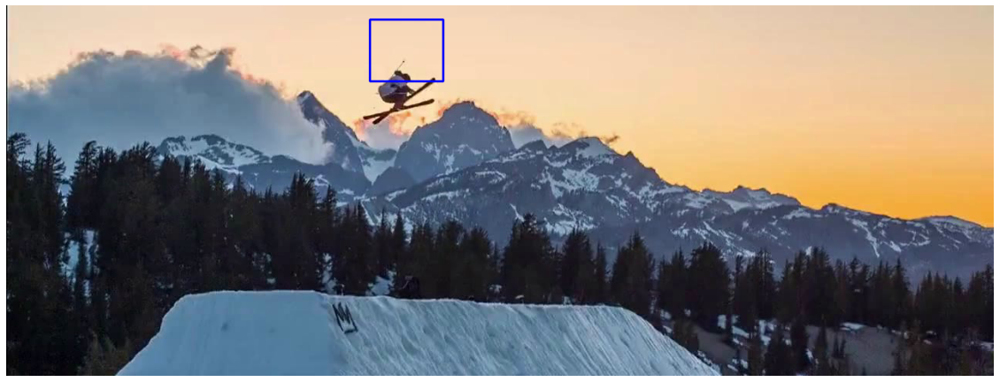

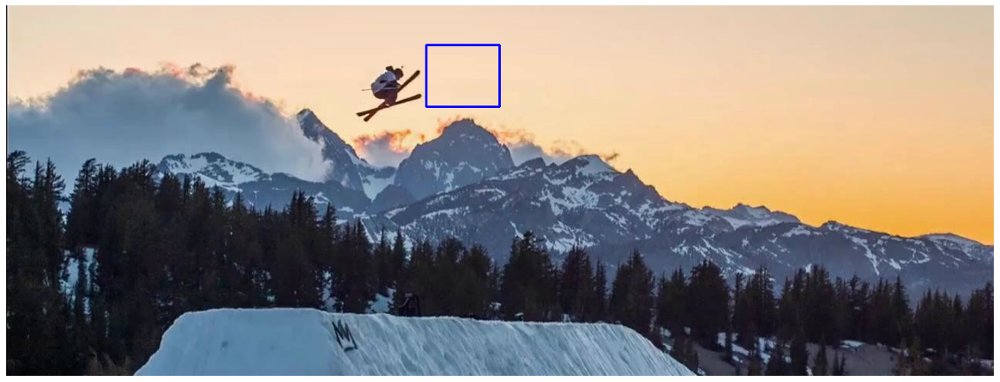

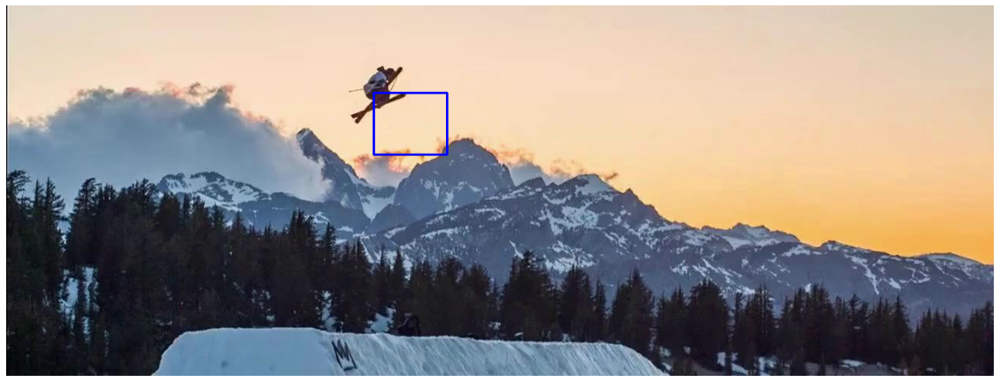

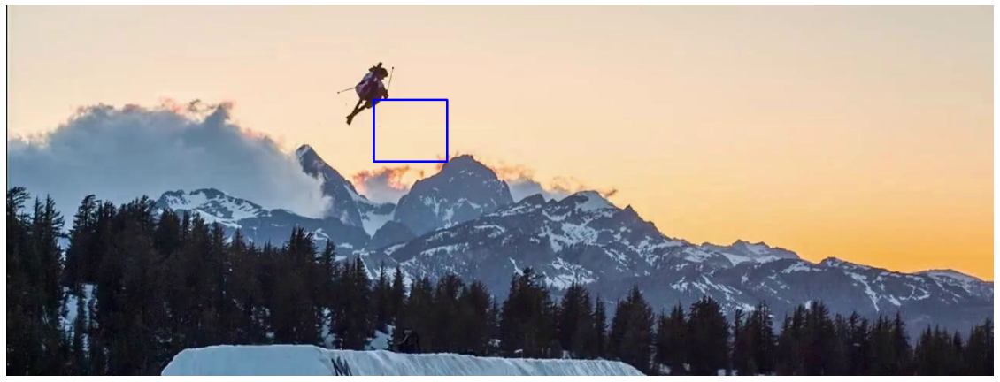

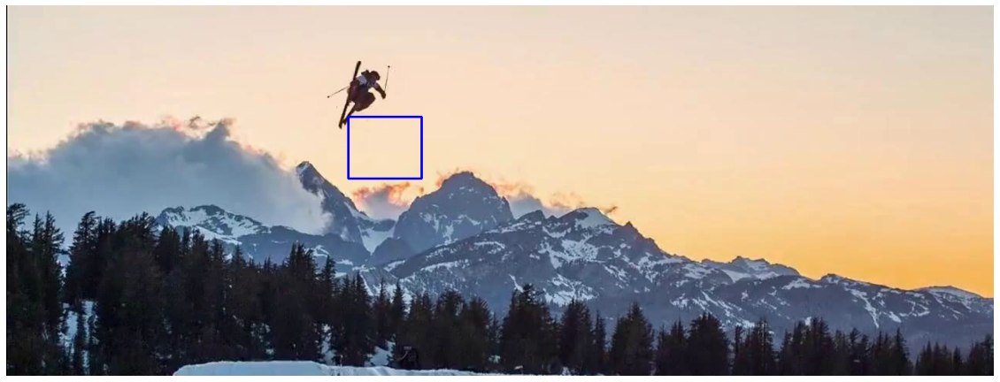

...

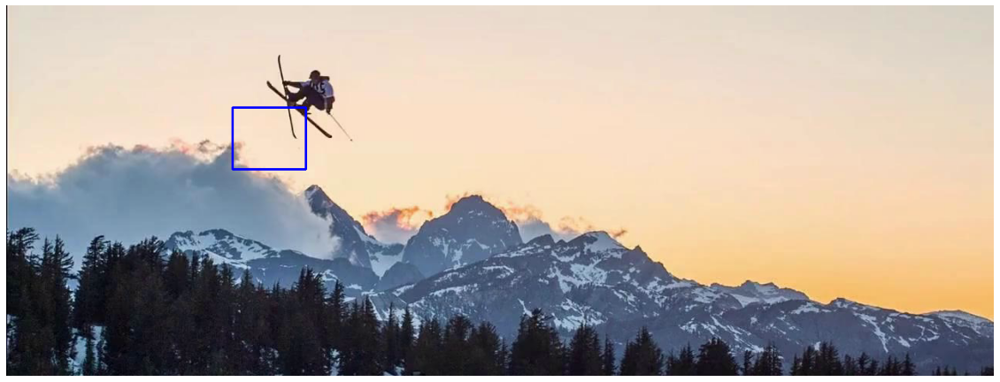

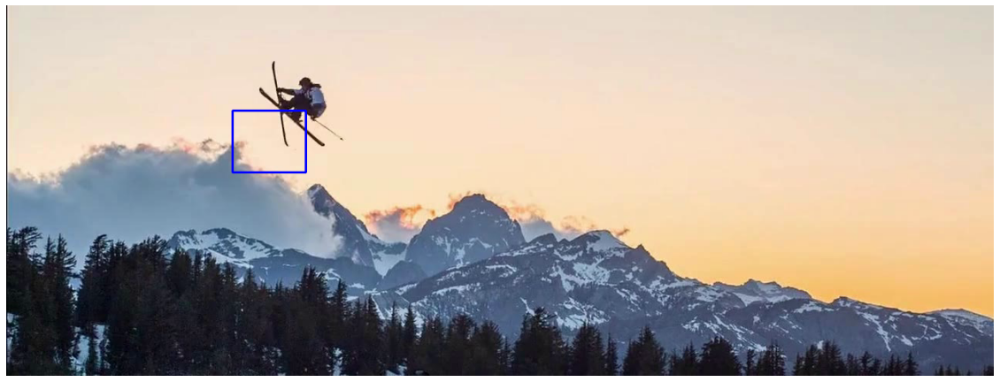

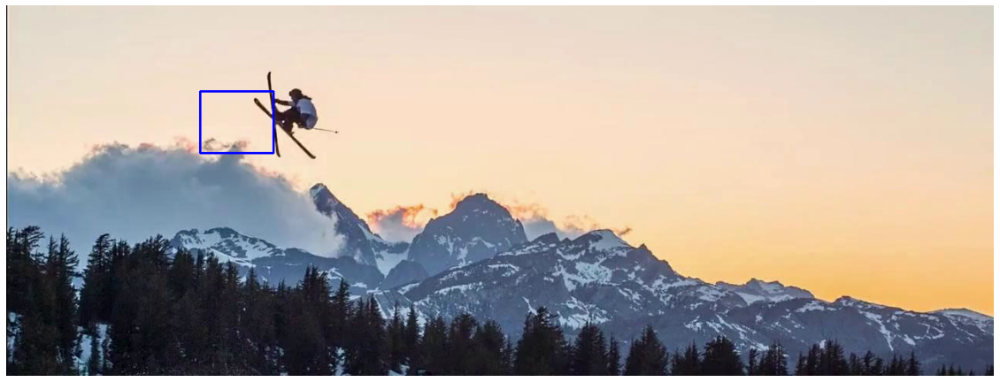

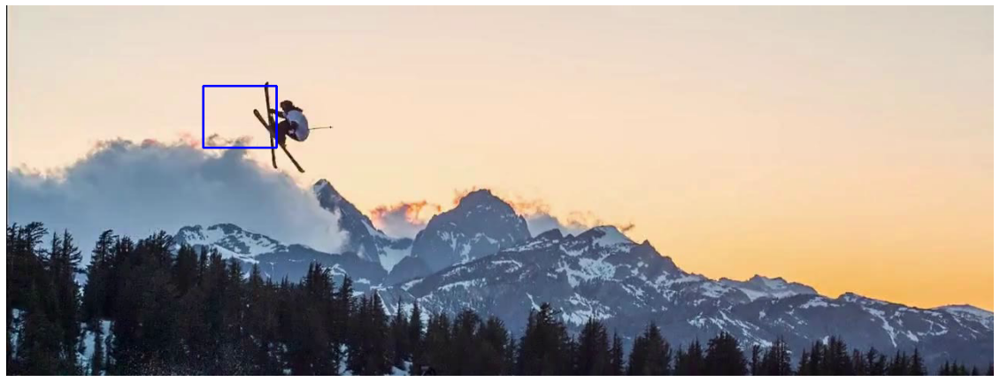

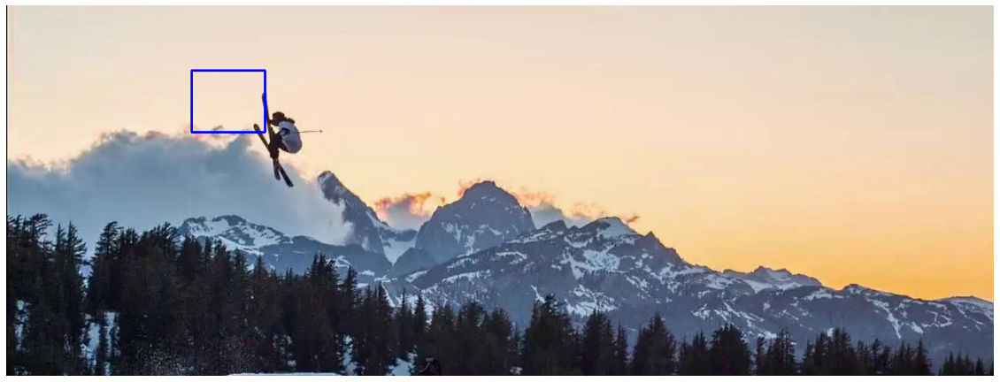

In [8]:
# Setup the termination criteria, either 10 iteration or move by atleast 1 pt
term_crit = ( cv2.TERM_CRITERIA_EPS | cv2.TERM_CRITERIA_COUNT, 10, 1 )

for n in range(30,60):
    frame = SKI_ARRAY[n].copy()
    hsv = cv2.cvtColor(frame, cv2.COLOR_BGR2HSV)
    dst = cv2.calcBackProject([hsv],[0],roi_hist,[0,180],1)
    #print(dst.shape)
    #plt.subplot(111)
    #plt.imshow(dst, cmap="gray")
    #plt.show()


    # apply meanshift to get the new location
    ret, track_window = cv2.meanShift(dst, track_window, term_crit)

    # Draw it on image
    if n%2==0:
        x,y,w,h = track_window
        img2 = cv2.rectangle(frame, (x,y), (x+w,y+h), 255,2)
        display(img2)

    #cv2.imwrite(chr(k)+".jpg",img2)

In [9]:
cv2.destroyAllWindows()

# 2. Background substraction


## 2.1 Using previous frame
**Advantantages:** very simple  
**Drawbacks:** needs background to be still / if there are large areas of same color in the moving object they get deleted (because altough the object moves the point at t and t+1 remains the same) / needs to define threshold

In [10]:
def show_background_substraction(current_frame, background_frame):
    list_images = [current_frame, background_frame]
    list_titles = ["Frame", "Background"]

    diff = cv2.absdiff(current_frame, background_frame)
    # threshold the diff image so that we get the foreground
    for thres in range(10, 150, 25):
        list_images.append(cv2.threshold(diff, thres, 255, cv2.THRESH_BINARY)[1])
        list_titles.append(f"Foregound (thres={thres})")


    fig, axes = plt.subplots(nrows=4, ncols=2, figsize=(15,15))
    for ax, image, title in zip(axes.flatten(), list_images, list_titles):
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        ax.imshow(image)
        ax.set_title(title)
        ax.axis('off')

    plt.tight_layout()  
    plt.show()


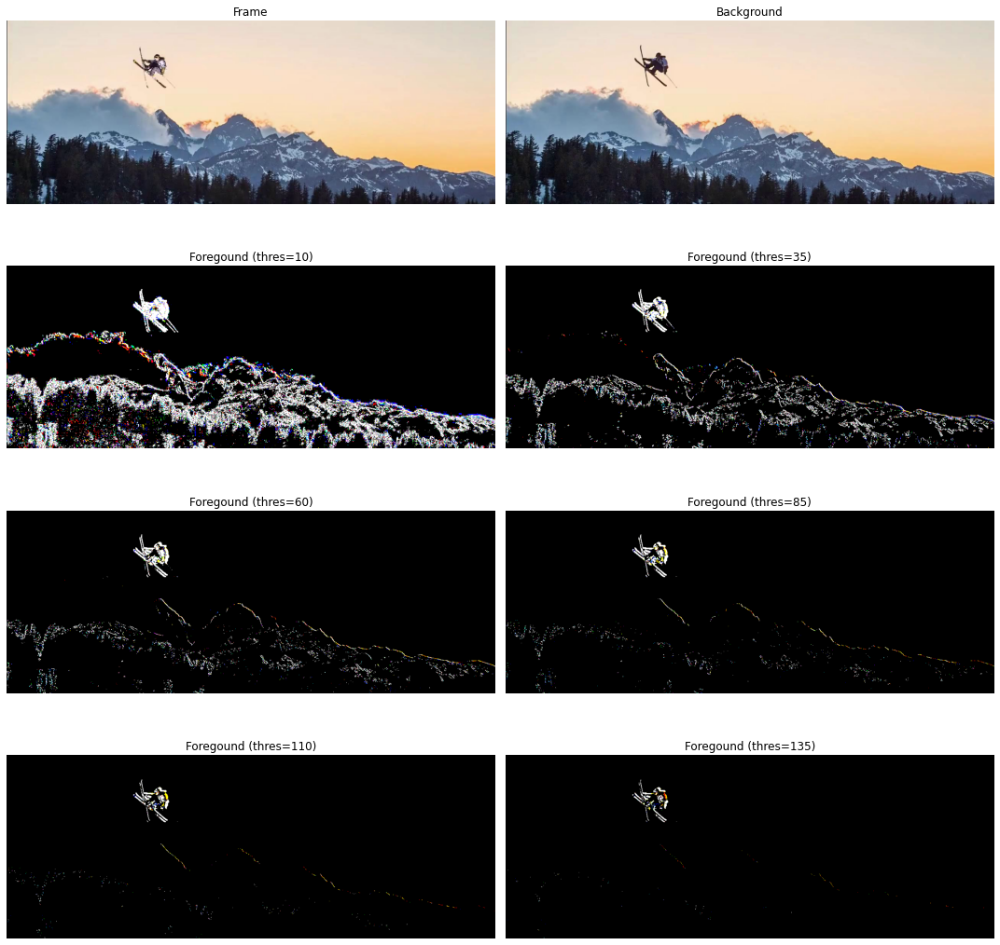

In [11]:
show_background_substraction(SKI_ARRAY[51], SKI_ARRAY[50])

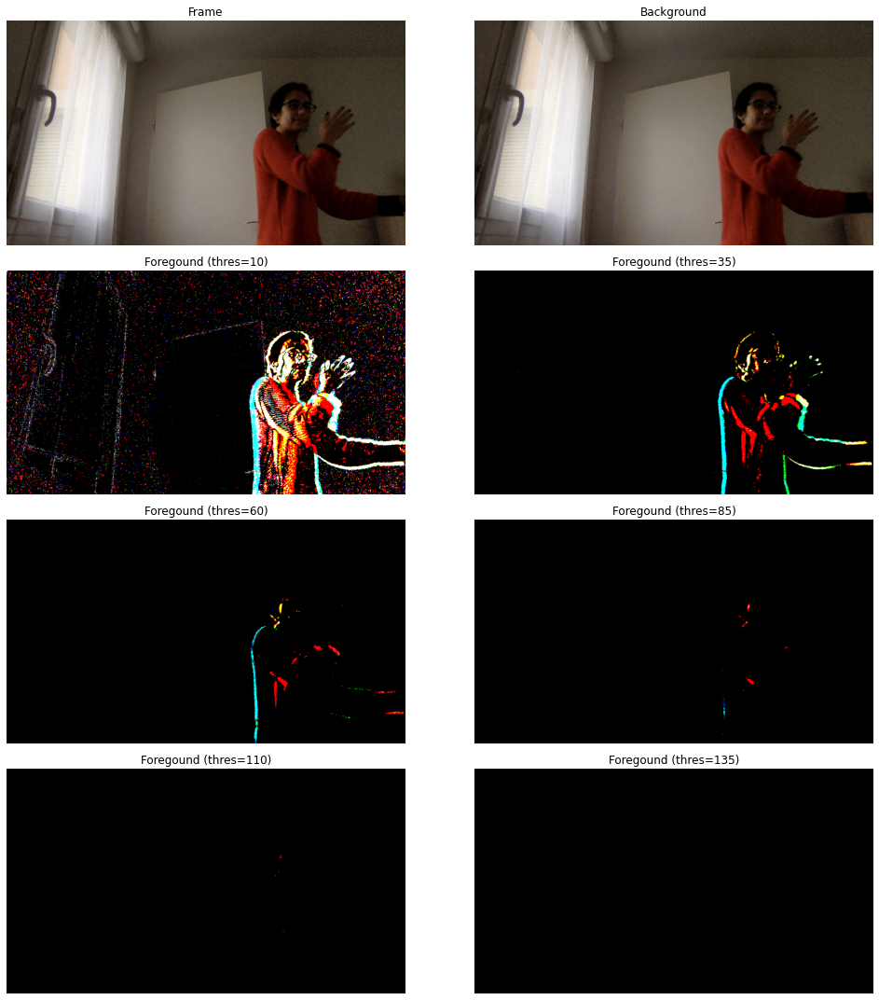

In [12]:
show_background_substraction(CAPTURE_ARRAY[51], CAPTURE_ARRAY[50])

### Write foreground video

In [13]:
def write_video(name, array, color=True):
    frame_width,frame_height = array[0].shape[:2][::-1]
    out = cv2.VideoWriter(name, cv2.VideoWriter_fourcc('M','J','P','G'), fps, (frame_width,frame_height), color)

    for i in range(len(array)):
        out.write(array[i])
    out.release()

In [14]:
img_array = []
n = 0

while n < len(CAPTURE_ARRAY):
    diff = cv2.absdiff(CAPTURE_ARRAY[n],CAPTURE_ARRAY[n-1])
    thres = cv2.threshold(diff, 20, 255, cv2.THRESH_BINARY)[1]
    img_array.append(thres)
    n += 1

write_video('foregroundcapture-substraction.avi', img_array)

## 2.2 Using median image
We consider that the background is the image made, for each pixel, of **the median for this pixel on all frames** -> we make the median pixel-wise (and channel-wise for color images). Then we can subtract it like before.

**Advantantages:** very simple / solves the areas of same color issue

**Drawbacks:** needs background to be still / needs to define threshold

(720, 1280, 3, 124)


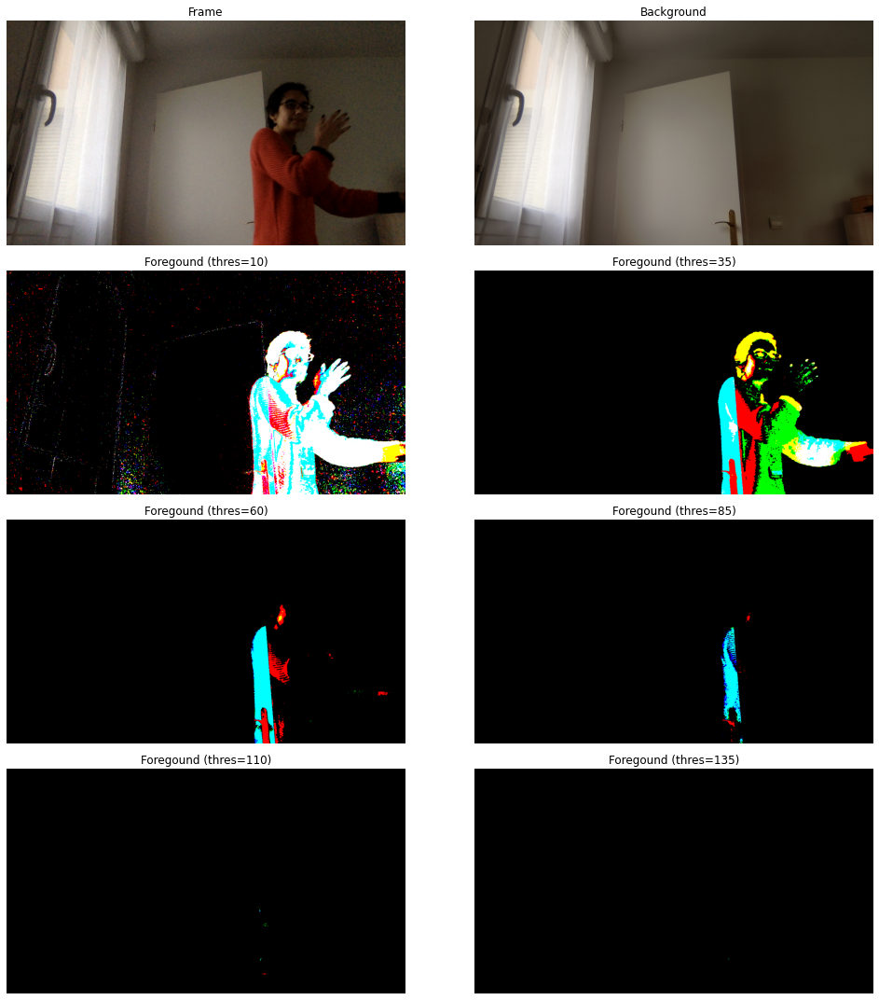

In [16]:
pixelwise_stacked = np.stack(CAPTURE_ARRAY, axis=-1)
print(np.shape(pixelwise_stacked))
median_image = np.median(pixelwise_stacked, axis=-1).astype(np.uint8)

show_background_substraction(CAPTURE_ARRAY[50], median_image)

In [17]:
img_array = [cv2.threshold(cv2.absdiff(frame, median_image), 35, 255, cv2.THRESH_BINARY)[1] for frame in CAPTURE_ARRAY]

write_video('foregroundcapture-median.avi', img_array)

## 2.3 Using mixture of Gaussians
Each element of background is modelized by a Gaussian. For each pixel, if it fits into a Gaussian then it's part of the bacvkground, otherwise we consider it's foreground.
Paper : [Adaptive background mixture models for real-time tracking](http://www.ai.mit.edu/projects/vsam/Publications/stauffer_cvpr98_track.pdf)  
**Advantages:** Enables to use not exactly still backgrounds (with moving leaves in trees, water, ...)  
**Drawbacks:** More complex

In [18]:
algo = 'MOG2' # or KNN

In [19]:
frames_per_second = 25

img_array = []
ref_frame = None

if algo == 'MOG2':
    backSub = cv2.createBackgroundSubtractorMOG2()
else:
    backSub = cv2.createBackgroundSubtractorKNN()

for frame in CAPTURE_ARRAY:
        # Write the frame into the file 'output.avi'
        fgmask = backSub.apply(frame)
        img_array.append(fgmask)

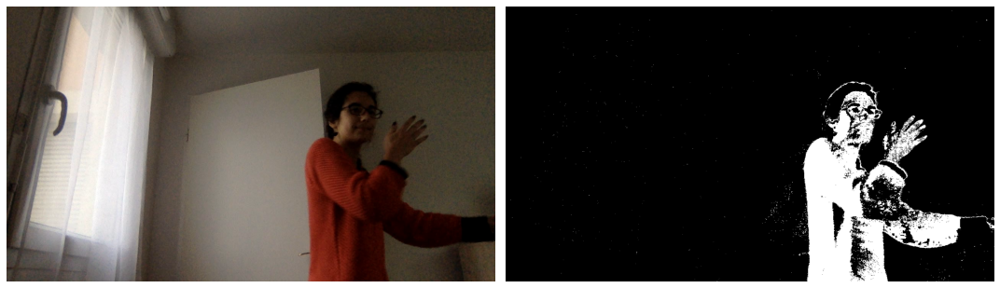

In [24]:
# show result background sub with gaussians on 1 image
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15,15))
axes[0].imshow(CAPTURE_ARRAY[50][:,:,::-1])
axes[0].axis('off')
axes[1].imshow(img_array[50], cmap="gray")
axes[1].axis('off')
plt.tight_layout()  
plt.show()

In [18]:
# write video gaussians
write_video('foregroundcapture-gaussians.avi', img_array, False)

## 2.4 Using depth data
Some cameras, like Microsoft Kinect, profide information about depth in the pixels.  
**Advantages:** Much more robust to light & color change, quite easy to do  
**Drawbacks:** Need depth camera

## 2.5 Considering video as volume of (x,y,t) and slicing at Y
You get a plane of lines, and the slant of the lines help us know the depth of the object creating this line.  
Paper : [Analyzing gait with spatiotemporal surfaces](http://persci.mit.edu/pub_pdfs/niyogi_gait.pdf)

![EPI image](https://www.researchgate.net/profile/Xinzhu_Sang/publication/299535657/figure/fig5/AS:713483737907201@1547119187222/Representation-of-light-field-a-multi-view-content-b-3D-light-field-and-c.jpg)

## 2.X Cleaning up data

The results we get out of the thresholding always have some random dots, etc.  
We can easily clean those and grow regions of interest by using operations on binary images --> see relevant notebook.